# Kmeans

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns

import os
os.environ["OMP_NUM_THREADS"] = "4"

from sklearn.metrics import *
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph

In [2]:
#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler

#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform

# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

In [3]:
df = pd.read_csv("sample75g.csv")

In [4]:
df = df.replace({"explicit": {False:0, True:1}})
df.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,genre
0,Anyway,274297,0,17,Sharyn,In Full Bloom,0.541,0.3100,11,-9.523,0.0479,0.813000,0.000037,0.308,0.3240,137.956,4.0,afrobeat
1,Entendiendo la Mente Humana,325999,0,2,Ondas Delta,Relajación Absoluta con Ondas Delta: Musicoter...,0.136,0.0671,2,-25.522,0.0494,0.989000,0.968000,0.105,0.0384,72.815,4.0,afrobeat
2,Yègellé Tezeta,194293,0,57,Mulatu Astatke,New York - Addis - London: The Story of Ethio ...,0.839,0.2330,3,-13.539,0.0413,0.745000,0.747000,0.105,0.7770,125.597,4.0,afrobeat
3,Wake (Studio),254946,0,49,Hillsong Young & Free;TAYA,We Are Young & Free,0.531,0.6730,4,-4.753,0.0325,0.000362,0.000000,0.462,0.2610,130.997,4.0,afrobeat
4,Canto para Siempre,319077,0,13,Juanafé;Carmen Lienqueo,Parrilladas Vargas (Vol. II),0.430,0.8290,4,-9.146,0.1620,0.084500,0.000000,0.112,0.4450,141.277,3.0,afrobeat


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              1500 non-null   object 
 1   duration_ms       1500 non-null   int64  
 2   explicit          1500 non-null   int64  
 3   popularity        1500 non-null   int64  
 4   artists           1500 non-null   object 
 5   album_name        1500 non-null   object 
 6   danceability      1500 non-null   float64
 7   energy            1500 non-null   float64
 8   key               1500 non-null   int64  
 9   loudness          1500 non-null   float64
 10  speechiness       1500 non-null   float64
 11  acousticness      1500 non-null   float64
 12  instrumentalness  1500 non-null   float64
 13  liveness          1500 non-null   float64
 14  valence           1500 non-null   float64
 15  tempo             1500 non-null   float64
 16  time_signature    1500 non-null   float64


In [6]:
genre_counts = df['genre'].value_counts()

print(genre_counts)

genre
afrobeat         75
black-metal      75
study            75
spanish          75
sleep            75
mandopop         75
j-idol           75
j-dance          75
iranian          75
industrial       75
indian           75
idm              75
happy            75
forro            75
disney           75
chicago-house    75
breakbeat        75
brazil           75
bluegrass        75
techno           75
Name: count, dtype: int64


In [7]:
nostrings = df.drop(columns = ['name','artists', 'explicit','album_name','genre'])

In [8]:
nostrings

,duration_ms,popularity,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,274297,17,0.541,0.3100,11,-9.523,0.0479,0.813000,0.000037,0.3080,0.3240,137.956,4.0
1,325999,2,0.136,0.0671,2,-25.522,0.0494,0.989000,0.968000,0.1050,0.0384,72.815,4.0
2,194293,57,0.839,0.2330,3,-13.539,0.0413,0.745000,0.747000,0.1050,0.7770,125.597,4.0
3,254946,49,0.531,0.6730,4,-4.753,0.0325,0.000362,0.000000,0.4620,0.2610,130.997,4.0
4,319077,13,0.430,0.8290,4,-9.146,0.1620,0.084500,0.000000,0.1120,0.4450,141.277,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,118256,42,0.872,0.5270,10,-12.910,0.0760,0.523000,0.117000,0.1570,0.0877,129.966,4.0
1496,400696,40,0.726,0.4930,0,-10.333,0.0399,0.031200,0.599000,0.1110,0.3140,124.995,4.0
1497,146000,38,0.789,0.6660,11,-10.272,0.1760,0.026600,0.220000,0.0851,0.5750,95.013,4.0
1498,419164,48,0.704,0.9430,8,-6.758,0.0779,0.004220,0.881000,0.1190,0.0608,129.995,4.0


In [62]:
X = nostrings.values

### MinMax

In [63]:
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(X)

In [64]:
kmeans = KMeans(n_clusters=3, n_init=10, max_iter=100, random_state=94)
kmeans.fit(X_minmax)

KMeans(max_iter=100, n_clusters=3, n_init=10, random_state=94)

In [65]:
df["kmeans.labels_MinMax"] = kmeans.labels_

In [66]:
df

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,genre,kmeans.labels_MinMax,kmeans.labels_std
0,Anyway,274297,0,17,Sharyn,In Full Bloom,0.541,0.3100,11,-9.523,0.0479,0.813000,0.000037,0.3080,0.3240,137.956,4.0,afrobeat,2,2
1,Entendiendo la Mente Humana,325999,0,2,Ondas Delta,Relajación Absoluta con Ondas Delta: Musicoter...,0.136,0.0671,2,-25.522,0.0494,0.989000,0.968000,0.1050,0.0384,72.815,4.0,afrobeat,2,2
2,Yègellé Tezeta,194293,0,57,Mulatu Astatke,New York - Addis - London: The Story of Ethio ...,0.839,0.2330,3,-13.539,0.0413,0.745000,0.747000,0.1050,0.7770,125.597,4.0,afrobeat,2,0
3,Wake (Studio),254946,0,49,Hillsong Young & Free;TAYA,We Are Young & Free,0.531,0.6730,4,-4.753,0.0325,0.000362,0.000000,0.4620,0.2610,130.997,4.0,afrobeat,0,0
4,Canto para Siempre,319077,0,13,Juanafé;Carmen Lienqueo,Parrilladas Vargas (Vol. II),0.430,0.8290,4,-9.146,0.1620,0.084500,0.000000,0.1120,0.4450,141.277,3.0,afrobeat,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,Chicago (Jersey Club),118256,0,42,DJ Smallz 732,Chicago (Jersey Club),0.872,0.5270,10,-12.910,0.0760,0.523000,0.117000,0.1570,0.0877,129.966,4.0,techno,2,0
1496,White Desert,400696,0,40,Pysh;Stephane Salerno,White Desert,0.726,0.4930,0,-10.333,0.0399,0.031200,0.599000,0.1110,0.3140,124.995,4.0,techno,1,1
1497,JUICY,146000,1,38,COUCOU CHLOE;Shygirl,NAUGHTY DOG,0.789,0.6660,11,-10.272,0.1760,0.026600,0.220000,0.0851,0.5750,95.013,4.0,techno,0,0
1498,Inside My Head,419164,0,48,AKKI (DE),Inside My Head,0.704,0.9430,8,-6.758,0.0779,0.004220,0.881000,0.1190,0.0608,129.995,4.0,techno,1,1


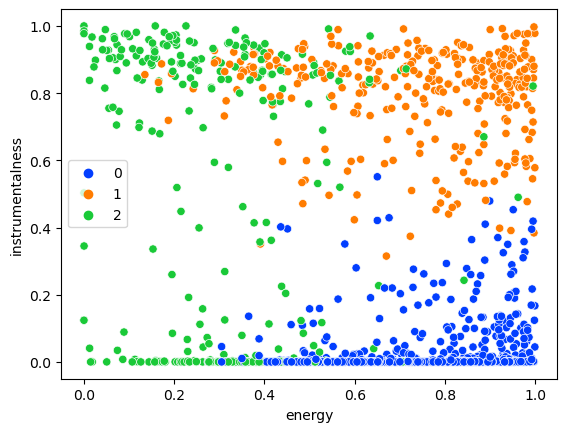

In [67]:
sns.scatterplot(data=df, 
                x="energy",
                y="instrumentalness",
                hue=kmeans.labels_,
                palette="bright")
plt.show()

In [68]:
kmeans.cluster_centers_

array([[0.35529771, 0.36716422, 0.61465547, 0.75289314, 0.4784802 ,
        0.72403178, 0.28003532, 0.19623177, 0.02760122, 0.26115559,
        0.53049797, 0.59950022, 0.79173554],
       [0.43862163, 0.22437018, 0.60482675, 0.7441641 , 0.52376981,
        0.62870412, 0.28240727, 0.09064039, 0.79911315, 0.21259059,
        0.39629205, 0.60255699, 0.79082569],
       [0.29981515, 0.33026585, 0.47193412, 0.30726183, 0.47936419,
        0.44137368, 0.20732857, 0.76685052, 0.44484238, 0.19463264,
        0.27183402, 0.50281795, 0.7392638 ]])

In [69]:
centers = scaler.inverse_transform(kmeans.cluster_centers_)
centers

array([[ 2.39599557e+05,  3.08417946e+01,  5.87610626e-01,
         7.52145218e-01,  5.26328217e+00, -6.14350177e+00,
         6.94487603e-02,  1.95250608e-01,  2.76012178e-02,
         2.26348760e-01,  5.24131995e-01,  1.27259509e+02,
         3.95867769e+00],
       [ 2.86800309e+05,  1.88470948e+01,  5.78214373e-01,
         7.43425076e-01,  5.76146789e+00, -8.88569725e+00,
         7.00370031e-02,  9.01871906e-02,  7.99113150e-01,
         1.87064526e-01,  3.91536544e-01,  1.27908388e+02,
         3.95412844e+00],
       [ 2.08170190e+05,  2.77423313e+01,  4.51169018e-01,
         3.06968491e-01,  5.27300613e+00, -1.42744448e+01,
         5.14174847e-02,  7.63016265e-01,  4.44842382e-01,
         1.72538344e-01,  2.68572009e-01,  1.06736184e+02,
         3.69631902e+00]])

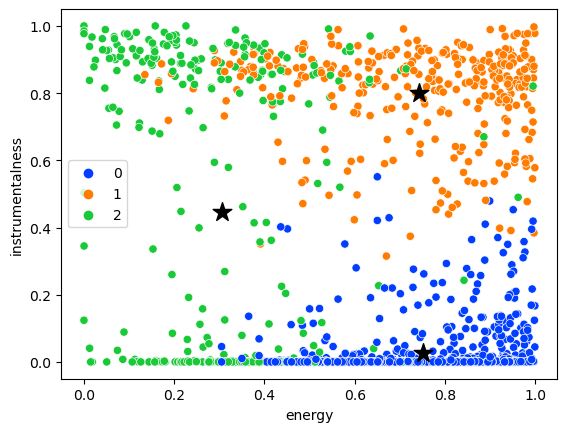

In [70]:
sns.scatterplot(data=df, 
                x="energy", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,3], centers[:,8], c='black', marker='*', s=200)
plt.show()

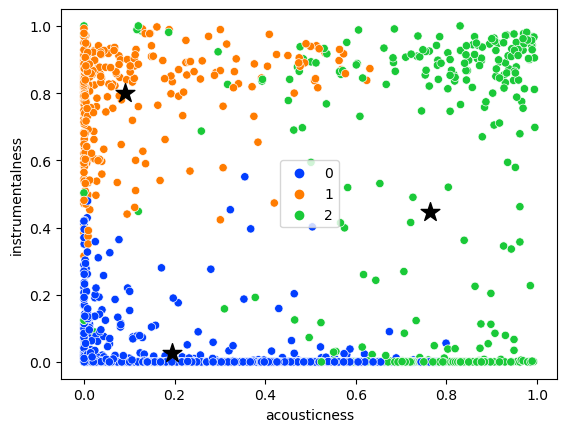

In [71]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,7], centers[:,8], c='black', marker='*', s=200)
plt.show()

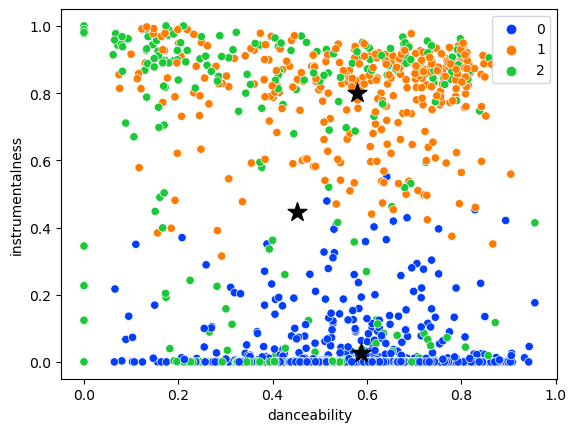

In [72]:
sns.scatterplot(data=df, 
                x="danceability", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,2], centers[:,8], c='black', marker='*', s=200)
plt.show()

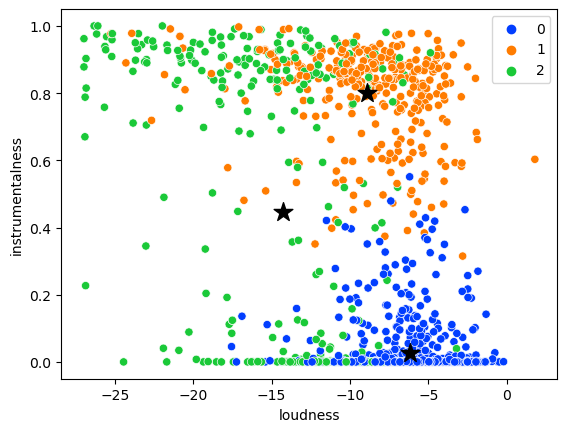

In [73]:
sns.scatterplot(data=df, 
                x="loudness", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,5], centers[:,8], c='black', marker='*', s=200)
plt.show()

In [21]:
##### Remember to do the categorization of the continuous variables to check for "y_mapping"

C:\Users\javie\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


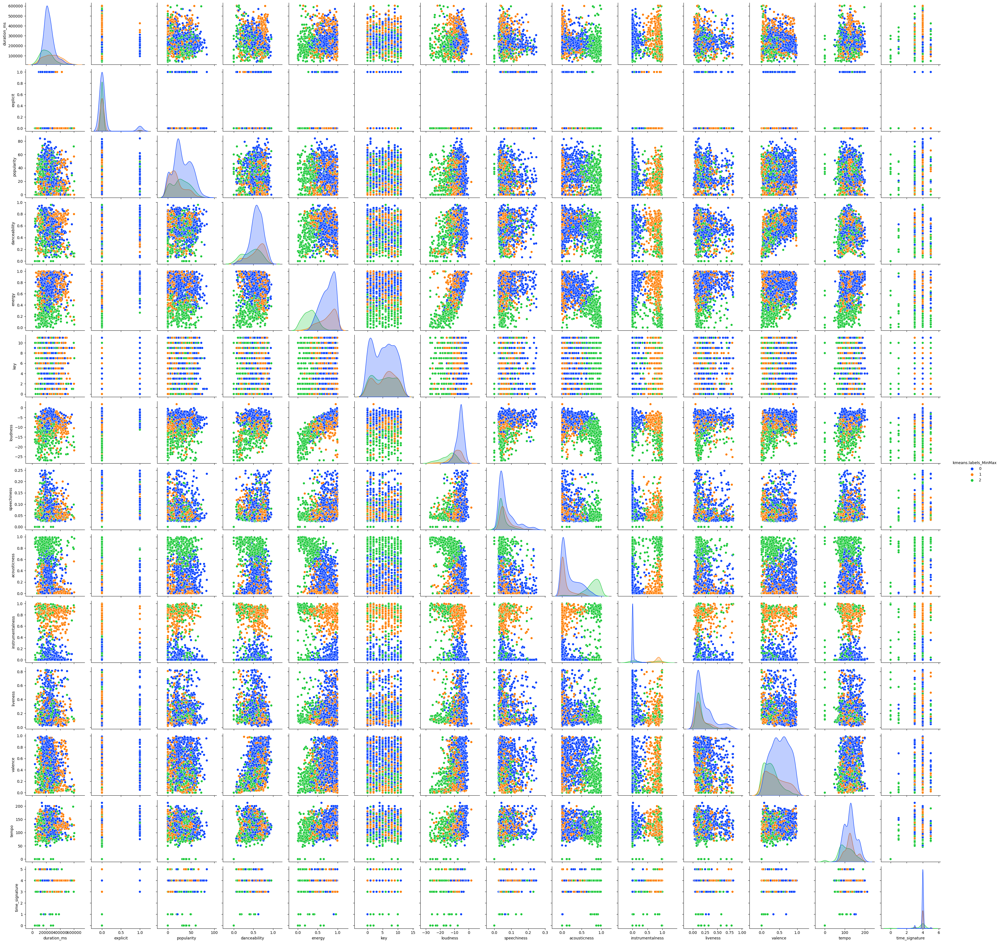

In [22]:
sns.pairplot(data=df, hue="kmeans.labels_MinMax", palette="bright")
#plt.savefig("pairplot k3 MinMax.png")
plt.show()

### SSE evaluation MinMax

In [23]:
np.unique(kmeans.labels_, return_counts=True)

(array([0, 1, 2]), array([847, 327, 326], dtype=int64))

In [24]:
print('SSE', kmeans.inertia_)
print('Silhouette', silhouette_score(X_minmax, kmeans.labels_))

SSE 780.7987573318246
Silhouette 0.20416062572128263


In [25]:
# how do we select the number of clusters k?

In [26]:
%%time
sse_list = []

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X_minmax)
    sse_list.append(kmeans.inertia_)

CPU times: total: 12.1 s
Wall time: 12.3 s


In [27]:
%%time
sil_list = []

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X_minmax)
    sil_list.append(silhouette_score(X_minmax, kmeans.labels_))

CPU times: total: 13.4 s
Wall time: 13.4 s


In [28]:
%%time
sil_list = []
dist = squareform(pdist(X_minmax)) # using a precomputed distance matrix

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X_minmax)
    sil_list.append(silhouette_score(dist, kmeans.labels_, metric='precomputed'))

CPU times: total: 12.5 s
Wall time: 13.1 s


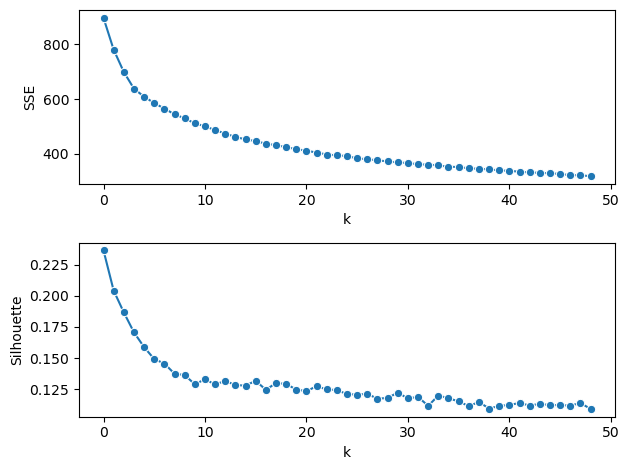

In [29]:
fig, axs = plt.subplots(2) 

sns.lineplot(x=range(len(sse_list)), y=sse_list, marker='o', ax=axs[0])
axs[0].set(xlabel='k', ylabel='SSE')

sns.lineplot(x=range(len(sil_list)), y=sil_list, marker='o', ax=axs[1])
axs[1].set(xlabel='k', ylabel='Silhouette')
#plt.savefig("silhouette MinMax.png")
plt.tight_layout() # Adjust the padding between and around subplots

### StandardScaler

In [30]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [31]:
kmeans = KMeans(n_clusters=3, n_init=10, max_iter=100, random_state=94)
kmeans.fit(X_std)

KMeans(max_iter=100, n_clusters=3, n_init=10, random_state=94)

In [32]:
df["kmeans.labels_std"] = kmeans.labels_

In [33]:
df

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,genre,kmeans.labels_MinMax,kmeans.labels_std
0,Anyway,274297,0,17,Sharyn,In Full Bloom,0.541,0.3100,11,-9.523,0.0479,0.813000,0.000037,0.3080,0.3240,137.956,4.0,afrobeat,2,2
1,Entendiendo la Mente Humana,325999,0,2,Ondas Delta,Relajación Absoluta con Ondas Delta: Musicoter...,0.136,0.0671,2,-25.522,0.0494,0.989000,0.968000,0.1050,0.0384,72.815,4.0,afrobeat,2,2
2,Yègellé Tezeta,194293,0,57,Mulatu Astatke,New York - Addis - London: The Story of Ethio ...,0.839,0.2330,3,-13.539,0.0413,0.745000,0.747000,0.1050,0.7770,125.597,4.0,afrobeat,2,0
3,Wake (Studio),254946,0,49,Hillsong Young & Free;TAYA,We Are Young & Free,0.531,0.6730,4,-4.753,0.0325,0.000362,0.000000,0.4620,0.2610,130.997,4.0,afrobeat,0,0
4,Canto para Siempre,319077,0,13,Juanafé;Carmen Lienqueo,Parrilladas Vargas (Vol. II),0.430,0.8290,4,-9.146,0.1620,0.084500,0.000000,0.1120,0.4450,141.277,3.0,afrobeat,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,Chicago (Jersey Club),118256,0,42,DJ Smallz 732,Chicago (Jersey Club),0.872,0.5270,10,-12.910,0.0760,0.523000,0.117000,0.1570,0.0877,129.966,4.0,techno,2,0
1496,White Desert,400696,0,40,Pysh;Stephane Salerno,White Desert,0.726,0.4930,0,-10.333,0.0399,0.031200,0.599000,0.1110,0.3140,124.995,4.0,techno,1,1
1497,JUICY,146000,1,38,COUCOU CHLOE;Shygirl,NAUGHTY DOG,0.789,0.6660,11,-10.272,0.1760,0.026600,0.220000,0.0851,0.5750,95.013,4.0,techno,0,0
1498,Inside My Head,419164,0,48,AKKI (DE),Inside My Head,0.704,0.9430,8,-6.758,0.0779,0.004220,0.881000,0.1190,0.0608,129.995,4.0,techno,1,1


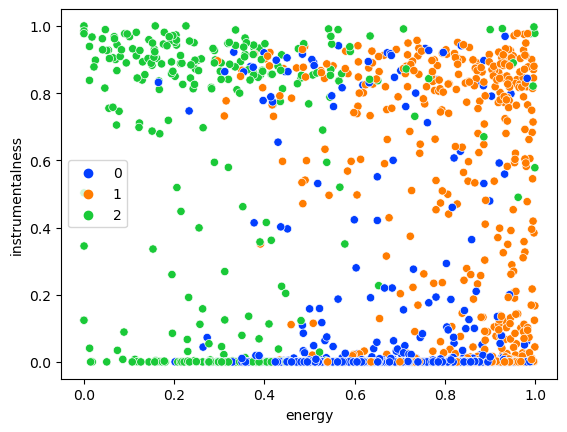

In [34]:
sns.scatterplot(data=df, 
                x="energy",
                y="instrumentalness",
                hue=kmeans.labels_,
                palette="bright")
plt.show()

In [35]:
kmeans.cluster_centers_

array([[-0.30697017,  0.4551594 ,  0.47616563,  0.10499728, -0.05368221,
         0.3495105 , -0.07395304,  0.00632375, -0.52502544, -0.14731911,
         0.62337281, -0.02312455,  0.15378576],
       [ 0.54680314, -0.44975387, -0.10585817,  0.65609437,  0.08627667,
         0.39292986,  0.28021338, -0.71826266,  0.25735246,  0.24308133,
        -0.27466103,  0.40820357,  0.10568561],
       [-0.31414847, -0.14758701, -0.77396459, -1.32506713, -0.03905648,
        -1.36772787, -0.32796132,  1.20770371,  0.61443955, -0.11790962,
        -0.78203431, -0.64724058, -0.48761975]])

In [36]:
centers = scaler.inverse_transform(kmeans.cluster_centers_)
centers

array([[ 2.13732149e+05,  3.61142410e+01,  6.47655712e-01,
         6.80478873e-01,  5.18309859e+00, -6.80030516e+00,
         6.24039124e-02,  2.97775805e-01,  8.49961271e-02,
         1.81247574e-01,  6.09961972e-01,  1.22211357e+02,
         3.97809077e+00],
       [ 2.95297738e+05,  1.90940959e+01,  5.35512362e-01,
         8.22121771e-01,  5.68081181e+00, -6.58810701e+00,
         7.79889299e-02,  6.46454473e-02,  3.85228571e-01,
         2.47080812e-01,  3.64659410e-01,  1.35812775e+02,
         3.95387454e+00],
       [ 2.13046367e+05,  2.47774295e+01,  4.06782759e-01,
         3.12923912e-01,  5.23510972e+00, -1.51927555e+01,
         5.12263323e-02,  6.84310992e-01,  5.22258425e-01,
         1.86206897e-01,  2.26067790e-01,  1.02530602e+02,
         3.65517241e+00]])

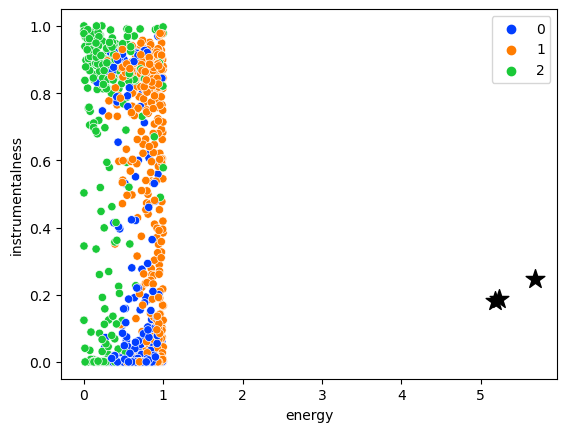

In [37]:
sns.scatterplot(data=df, 
                x="energy", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,4], centers[:,9], c='black', marker='*', s=200)
plt.show()

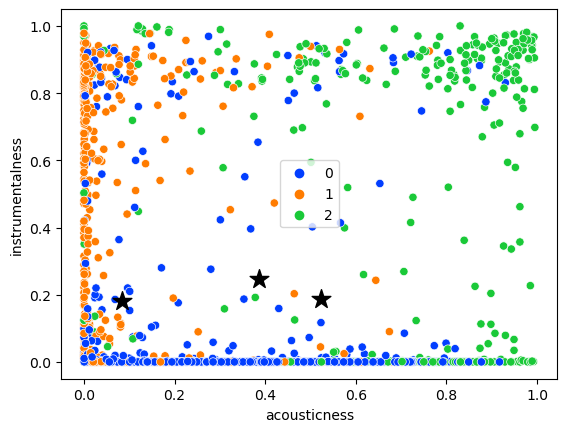

In [38]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,8], centers[:,9], c='black', marker='*', s=200)
plt.show()

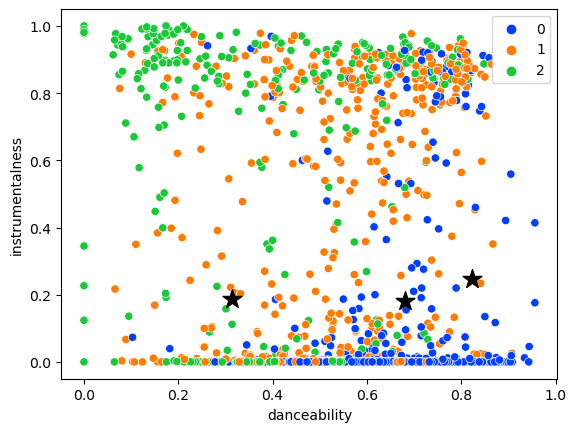

In [39]:
sns.scatterplot(data=df, 
                x="danceability", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,3], centers[:,9], c='black', marker='*', s=200)
plt.show()

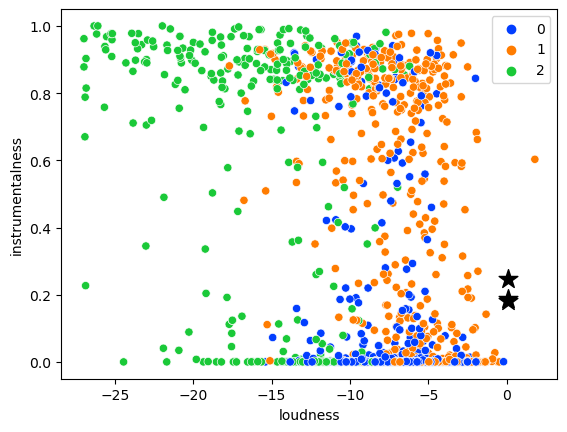

In [40]:
sns.scatterplot(data=df, 
                x="loudness", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,6], centers[:,9], c='black', marker='*', s=200)
plt.show()

In [41]:
##### Remember to do the categorization of the continuous variables to check for "y_mapping"

C:\Users\javie\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


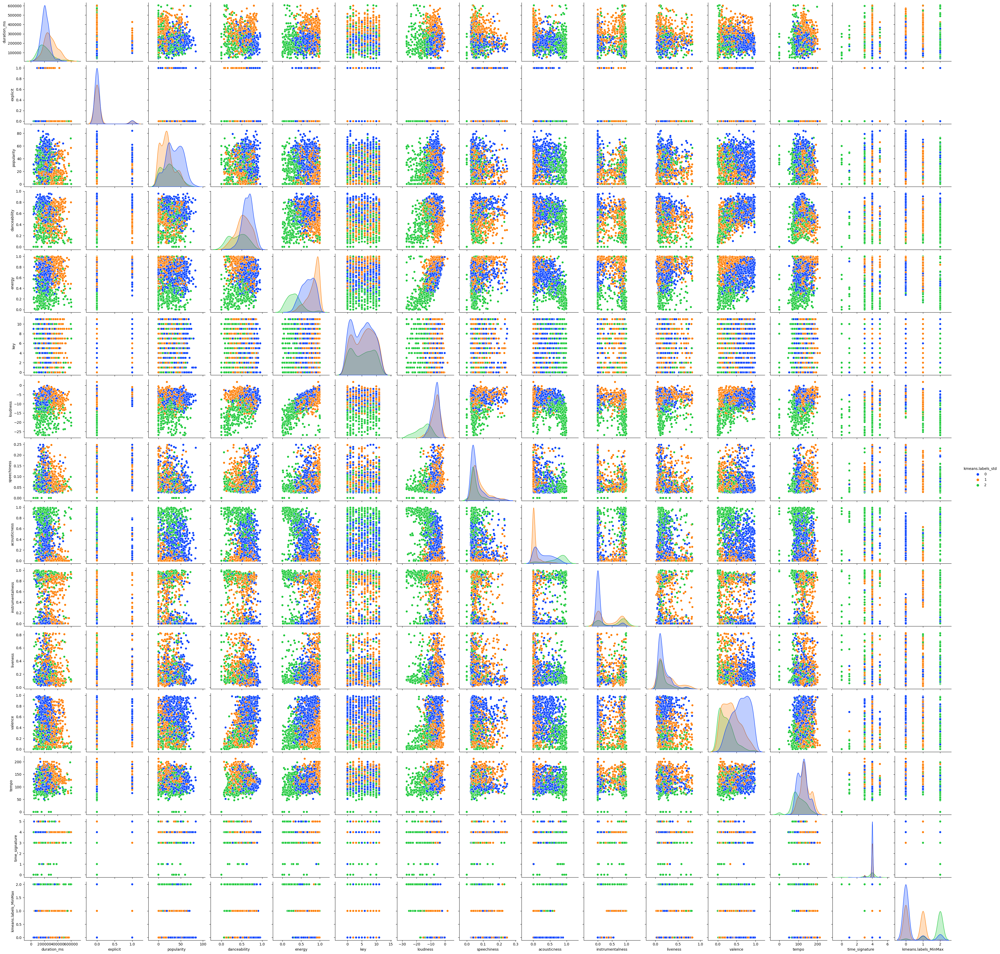

In [42]:
sns.pairplot(data=df, hue="kmeans.labels_std", palette="bright")
#plt.savefig("pairplot k3 std.png")
plt.show()

### SSE evaluation Std

In [43]:
np.unique(kmeans.labels_, return_counts=True)

(array([0, 1, 2]), array([637, 544, 319], dtype=int64))

In [44]:
print('SSE', kmeans.inertia_)
print('Silhouette', silhouette_score(X_std, kmeans.labels_))

SSE 15076.23365471881
Silhouette 0.10560549420468389


In [45]:
# how do we select the number of clusters k?

In [46]:
%%time
sse_list = []

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X_std)
    sse_list.append(kmeans.inertia_)

CPU times: total: 13.3 s
Wall time: 12.3 s


In [47]:
%%time
sil_list = []

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X_std)
    sil_list.append(silhouette_score(X_std, kmeans.labels_))

CPU times: total: 13.2 s
Wall time: 14.6 s


In [48]:
%%time
sil_list = []
dist = squareform(pdist(X_std)) # using a precomputed distance matrix

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X_std)
    sil_list.append(silhouette_score(dist, kmeans.labels_, metric='precomputed'))

CPU times: total: 7.14 s
Wall time: 15.3 s


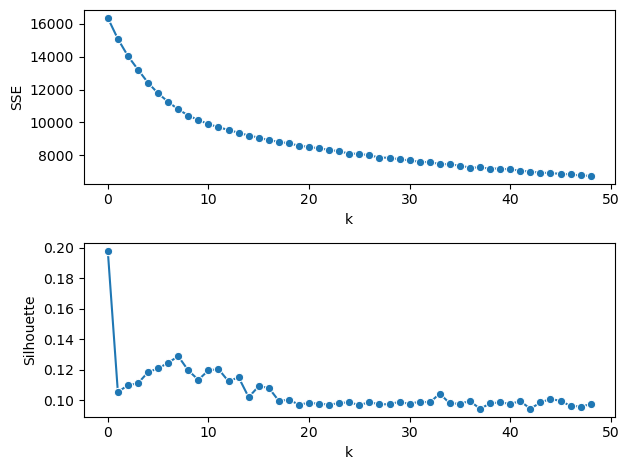

In [49]:
fig, axs = plt.subplots(2) 

sns.lineplot(x=range(len(sse_list)), y=sse_list, marker='o', ax=axs[0])
axs[0].set(xlabel='k', ylabel='SSE')

sns.lineplot(x=range(len(sil_list)), y=sil_list, marker='o', ax=axs[1])
axs[1].set(xlabel='k', ylabel='Silhouette')
#plt.savefig("silhouette std.png")
plt.tight_layout() # Adjust the padding between and around subplots

## DBSCAN

# MinMax

In [50]:
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(X)

### DBScan

In [51]:
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan.fit(X_minmax)

DBSCAN()

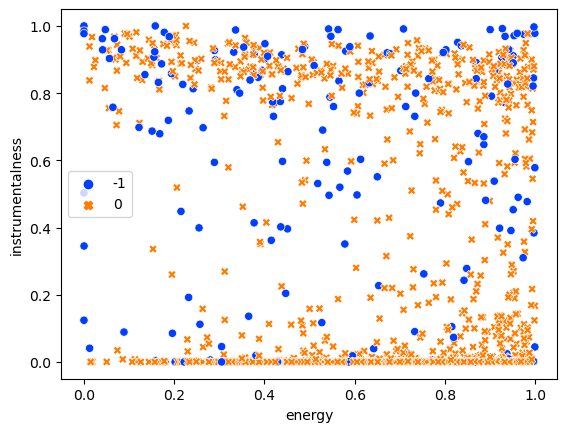

In [52]:
sns.scatterplot(data=df, 
                x="energy", 
                y="instrumentalness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

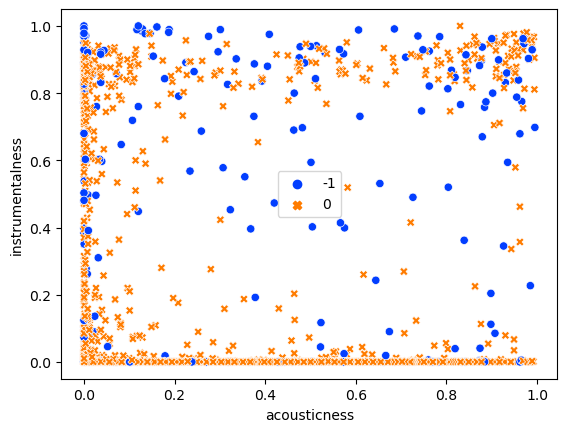

In [53]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

### kth neighbor distance

In [54]:
np.unique(dbscan.labels_, return_counts=True)

(array([-1,  0], dtype=int64), array([ 209, 1291], dtype=int64))

In [55]:
dbscan.labels_

array([ 0,  0, -1, ...,  0,  0,  0], dtype=int64)

In [56]:
print('Silhouette', silhouette_score(X_minmax, dbscan.labels_)) # counting silhouette also w.r.t to noise cluster (-1)
print('Silhouette', silhouette_score(X_minmax[dbscan.labels_ != -1], dbscan.labels_[dbscan.labels_ != -1]))

Silhouette 0.14236714728684244


ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

### kth neighbor distance

In [ ]:
dist = pdist(X_minmax, 'euclidean')
dist = squareform(dist)

In [ ]:
#sns.heatmap(dist, cmap="Greens_r", annot=False)
#plt.show()

In [ ]:
k=4
kth_distances = []

for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances.append(d[index_kth_distance])  # store the distance in a list

In [ ]:
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('distance from the {}th neighbor'.format(k))
         
plt.show()

In [ ]:
ks = [4, 8, 16, 32]

fig = plt.figure(figsize=(16, 3)) # dimensions of the overall plot
fig_dims = (1, len(ks))

for i in range(len(ks)):
    k = ks[i]
    kth_distances = []

    for d in dist:  # d is a vector containing distances between the ith record and all the others
        index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
        kth_distances.append(d[index_kth_distance])  # store the distance in a list

    plt.subplot2grid(fig_dims, (0, i))
    plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
    plt.ylabel('distance from the {}th neighbor'.format(k))
             
plt.tight_layout()
plt.show()

In [ ]:
dbscan = DBSCAN(eps=0.7, min_samples=4, metric='precomputed')
dbscan.fit(dist)

In [ ]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

In [ ]:
np.unique(dbscan.labels_, return_counts=True)

In [ ]:
df["labels"] = dbscan.labels_

In [ ]:
sns.pairplot(data=df, hue="labels", palette="bright")
#plt.savefig("pairplot DBSCAN MinMax.png")
plt.show()

# Standard Scaler

In [ ]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

### DBScan

In [ ]:
dbscan = DBSCAN(eps=3, min_samples=4)
dbscan.fit(X_std)

In [ ]:
sns.scatterplot(data=df, 
                x="energy", 
                y="instrumentalness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

In [ ]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

### kth neighbor distance

In [ ]:
np.unique(dbscan.labels_, return_counts=True)

In [ ]:
dbscan.labels_

In [ ]:
print('Silhouette', silhouette_score(X_std, dbscan.labels_)) # counting silhouette also w.r.t to noise cluster (-1)
print('Silhouette', silhouette_score(X_std[dbscan.labels_ != -1], dbscan.labels_[dbscan.labels_ != -1]))

### kth neighbor distance

In [ ]:
dist = pdist(X_std, 'euclidean')
dist = squareform(dist)

In [ ]:
k=4
kth_distances = []

for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances.append(d[index_kth_distance])  # store the distance in a list

In [ ]:
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('distance from the {}th neighbor'.format(k))
         
plt.show()

In [ ]:
ks = [4, 8, 16, 32]

fig = plt.figure(figsize=(16, 3)) # dimensions of the overall plot
fig_dims = (1, len(ks))

for i in range(len(ks)):
    k = ks[i]
    kth_distances = []

    for d in dist:  # d is a vector containing distances between the ith record and all the others
        index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
        kth_distances.append(d[index_kth_distance])  # store the distance in a list

    plt.subplot2grid(fig_dims, (0, i))
    plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
    plt.ylabel('distance from the {}th neighbor'.format(k))
             
plt.tight_layout()
plt.show()

In [ ]:
dbscan = DBSCAN(eps=4, min_samples=8, metric='precomputed')
dbscan.fit(dist)

In [ ]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

In [ ]:
np.unique(dbscan.labels_, return_counts=True)

In [ ]:
df["labels"] = dbscan.labels_

In [ ]:
sns.pairplot(data=df, hue="labels", palette="bright")
#plt.savefig("pairplot DBSCAN std.png")
plt.show()

# Hierarchical

### MinMax

In [ ]:
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(X)

### Hierarchical

In [ ]:
def get_linkage_matrix(model):
    # Create linkage matrix 
    
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    return linkage_matrix

def plot_dendrogram(model, **kwargs):
    linkage_matrix = get_linkage_matrix(model)
    dendrogram(linkage_matrix, **kwargs)

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
# it is the linkage distance threshold above which clusters will not be merged
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='euclidean', linkage='complete')
model = model.fit(X_minmax)

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode='lastp', color_threshold=2.5)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [ ]:
# get the labels according to a specific threshold value cut
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=2.5, criterion='distance')

In [ ]:
labels

In [ ]:
print('Silhouette', silhouette_score(X_minmax, labels))

#### Choosing the number of clusters

In [ ]:
hier = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='complete')
hier.fit(X_minmax)

In [ ]:
hier.labels_

In [ ]:
dist = pdist(X_minmax, 'euclidean')
dist = squareform(dist)

#### Precomputed distance matrix

In [ ]:
hier = AgglomerativeClustering(n_clusters=2, metric='precomputed', linkage='complete')
hier.fit(dist)

In [ ]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

In [ ]:
np.unique(hier.labels_, return_counts=True)

In [ ]:
df["labels"] = hier.labels_

In [ ]:
sns.pairplot(data=df, hue="labels", palette="bright")
#plt.savefig("pairplot Hier MinMax complete k4.png")
plt.show()

### Ward hierarchical

In [ ]:
# hierarchical clustering
# Compute the (weighted) graph of k-Neighbors for points in X
connectivity = kneighbors_graph(X_minmax, n_neighbors=100, include_self=False)

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, 
                                n_clusters=None, 
                                metric='euclidean', 
                                linkage='ward', 
                                connectivity=connectivity)
                                
# connecet: Defines for each sample the neighboring 
# samples following a given structure of the data.

model = model.fit(X_minmax)

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [ ]:
ward = AgglomerativeClustering(n_clusters=3, 
                               linkage='ward', 
                               metric='euclidean',
                               connectivity=connectivity)
ward.fit(X_minmax)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_minmax, ward.labels_))

In [ ]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=ward.labels_, 
                style=ward.labels_, 
                palette="bright")
plt.show()

In [ ]:
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=43, criterion='distance')

In [ ]:
df["labels"] = ward.labels_

In [ ]:
sns.pairplot(data=df, hue="labels", palette="bright")
#plt.savefig("pairplot Hier MinMax Ward.png")
plt.show()

In [ ]:
print('average linkage')
average_linkage = AgglomerativeClustering(n_clusters=3, linkage='average', metric='manhattan',  connectivity=connectivity)
average_linkage.fit(X_minmax)

hist, bins = np.histogram(average_linkage.labels_, 
                          bins=range(0, len(set(average_linkage.labels_)) + 1))

print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_minmax, average_linkage.labels_))

In [ ]:
print('complete linkage')
complete_linkage = AgglomerativeClustering(n_clusters=3, linkage='complete', metric='l1', connectivity=connectivity)
complete_linkage.fit(X_minmax)

hist, bins = np.histogram(complete_linkage.labels_, 
                          bins=range(0, len(set(complete_linkage.labels_)) + 1))

print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_minmax, complete_linkage.labels_))

### Linkage = 'single'

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
# it is the linkage distance threshold above which clusters will not be merged
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='euclidean', linkage='single')
model = model.fit(X_minmax)

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode='lastp', color_threshold=1)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [ ]:
# get the labels according to a specific threshold value cut
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=0.99, criterion='distance')

In [ ]:
labels

In [ ]:
print('Silhouette', silhouette_score(X_minmax, labels))

#### Choosing the number of clusters

In [ ]:
hier = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='single')
hier.fit(X_minmax)

In [ ]:
hier.labels_

#### Precomputed distance matrix

In [ ]:
hier = AgglomerativeClustering(n_clusters=3, metric='precomputed', linkage='single')
hier.fit(dist)

In [ ]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

In [ ]:
df["labels"] = hier.labels_

In [ ]:
sns.pairplot(data=df, hue="labels", palette="bright")
#plt.savefig("pairplot Hier MinMax single.png")
plt.show()

## StandardScaler

In [ ]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

### Hierarchical

In [ ]:
def get_linkage_matrix(model):
    # Create linkage matrix 
    
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    return linkage_matrix

def plot_dendrogram(model, **kwargs):
    linkage_matrix = get_linkage_matrix(model)
    dendrogram(linkage_matrix, **kwargs)

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
# it is the linkage distance threshold above which clusters will not be merged
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='euclidean', linkage='complete')
model = model.fit(X_std)

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode='lastp', color_threshold=10)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [ ]:
# get the labels according to a specific threshold value cut
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=10, criterion='distance')

In [ ]:
labels

In [ ]:
print('Silhouette', silhouette_score(X_minmax, labels))

#### Choosing the number of clusters

In [ ]:
hier = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='complete')
hier.fit(X_std)

In [ ]:
hier.labels_

In [ ]:
dist = pdist(X_std, 'euclidean')
dist = squareform(dist)

#### Precomputed distance matrix

In [ ]:
hier = AgglomerativeClustering(n_clusters=4, metric='precomputed', linkage='complete')
hier.fit(dist)

In [ ]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

In [ ]:
np.unique(hier.labels_, return_counts=True)

In [ ]:
df["labels"] = hier.labels_

In [ ]:
sns.pairplot(data=df, hue="labels", palette="bright")
#plt.savefig("pairplot Hier STD complete k4.png")
plt.show()

### Ward hierarchical

In [ ]:
# hierarchical clustering
# Compute the (weighted) graph of k-Neighbors for points in X
connectivity = kneighbors_graph(X_std, n_neighbors=100, include_self=False)

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, 
                                n_clusters=None, 
                                metric='euclidean', 
                                linkage='ward', 
                                connectivity=connectivity)
                                
# connecet: Defines for each sample the neighboring 
# samples following a given structure of the data.

model = model.fit(X_std)

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [ ]:
ward = AgglomerativeClustering(n_clusters=3, 
                               linkage='ward', 
                               metric='euclidean',
                               connectivity=connectivity)
ward.fit(X_std)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_std, ward.labels_))

In [ ]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=ward.labels_, 
                style=ward.labels_, 
                palette="bright")
plt.show()

In [ ]:
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=43, criterion='distance')

In [ ]:
df["labels"] = ward.labels_

In [ ]:
sns.pairplot(data=df, hue="labels", palette="bright")
#plt.savefig("pairplot Hier STD Ward.png")
plt.show()

In [ ]:
print('average linkage')
average_linkage = AgglomerativeClustering(n_clusters=3, linkage='average', metric='manhattan',  connectivity=connectivity)
average_linkage.fit(X_std)

hist, bins = np.histogram(average_linkage.labels_, 
                          bins=range(0, len(set(average_linkage.labels_)) + 1))

print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_std, average_linkage.labels_))

In [ ]:
print('complete linkage')
complete_linkage = AgglomerativeClustering(n_clusters=3, linkage='complete', metric='l1', connectivity=connectivity)
complete_linkage.fit(X_std)

hist, bins = np.histogram(complete_linkage.labels_, 
                          bins=range(0, len(set(complete_linkage.labels_)) + 1))

print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_std, complete_linkage.labels_))

### Linkage = 'single'

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
# it is the linkage distance threshold above which clusters will not be merged
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='euclidean', linkage='single')
model = model.fit(X_std)

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode='lastp', color_threshold=4.5)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [ ]:
# get the labels according to a specific threshold value cut
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=4.5, criterion='distance')

In [ ]:
labels

In [ ]:
print('Silhouette', silhouette_score(X_std, labels))

#### Choosing the number of clusters

In [ ]:
hier = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='single')
hier.fit(X_std)

In [ ]:
hier.labels_

#### Precomputed distance matrix

In [ ]:
hier = AgglomerativeClustering(n_clusters=3, metric='precomputed', linkage='single')
hier.fit(dist)

In [ ]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

In [ ]:
df["labels"] = hier.labels_

In [ ]:
sns.pairplot(data=df, hue="labels", palette="bright")
#plt.savefig("pairplot Hier STD single.png")
plt.show()